# Single shot detection (SSD)

In [1]:
%matplotlib inline
%reload_ext autoreload
%autoreload 2

In [2]:
from fastai.conv_learner import *
from fastai.dataset import *

from pathlib import Path
import json, pdb
from matplotlib import patches, patheffects

In [3]:
torch.backends.cudnn.benchmark = True

## Dataset

In [4]:
PATH = Path('data/pascal_voc/')
trn_json = json.load((PATH/'pascal_train2007.json').open())

In [5]:
IMAGES,ANNOTATIONS,CATEGORIES = 'images', 'annotations', 'categories'
FN, ID, IMG_ID, CAT_ID, BBOX, NAME = 'file_name', 'id', 'image_id', 'category_id', 'bbox', 'name'

In [6]:
cats = dict((o[ID], o[NAME]) for o in trn_json[CATEGORIES])

In [7]:
train_fn = dict((o[ID], o[FN]) for o in trn_json[IMAGES])

In [8]:
train_ids = [o[ID] for o in trn_json[IMAGES]]

In [9]:
JPEGS = 'VOC2007/JPEGImages'

In [10]:
IMPATH = PATH/JPEGS

In [11]:
def convert_bb_to_np(bb):
    return np.array([bb[1], bb[0], bb[1] + bb[3] - 1, bb[0] + bb[2] - 1])

def convert_bb_to_VOC(bb):
    return np.array([bb[1], bb[0], bb[3]-bb[1] + 1, bb[2]-bb[0] + 1])

In [12]:
def get_train_annot():
    train_annotations = collections.defaultdict(lambda: [])
    for o in trn_json[ANNOTATIONS]:
        if not o['ignore']:
            bb = o[BBOX]
            bb = convert_bb_to_np(bb)
            train_annotations[o[IMG_ID]].append((bb, o[CAT_ID]))
    return train_annotations

In [13]:
train_annot = get_train_annot()

**Convenience functions for plotting:**

In [14]:
def show_img(img, figsize=None, ax=None):
    if not ax:
        fig, ax = plt.subplots(figsize=figsize)
    ax.imshow(img),
    ax.set_xticks(np.linspace(0, 224, 8))
    ax.set_yticks(np.linspace(0, 224, 8))
    ax.grid()
    ax.set_xticklabels([])
    ax.set_yticklabels([])
    return ax

In [15]:
def draw_outline(matplt_plot_obj, lw):    matplt_plot_obj.set_path_effects([patheffects.Stroke(linewidth=lw, foreground='black'), patheffects.Normal()])

In [16]:
def draw_rect(ax, bbox, color='white'):
    patch = ax.add_patch(patches.Rectangle(bbox[:2], *bbox[-2:], fill=False, edgecolor=color, lw=2))
    draw_outline(patch, 4)

In [17]:
def draw_text(ax, xy, text, sz=14, color='white'):
    pass
    txt = ax.text(*xy, text, verticalalignment='top', color=color, fontsize=sz, weight='bold')
    draw_outline(txt, 1)

In [18]:
def draw_image(im, annot):
    ax = show_img(im, figsize=(16, 8))
    for bbox, cat in annot:
        bb = convert_bb_to_VOC(bbox)
        draw_rect(ax, bb)
        draw_text(ax, bb[:2], cats[cat], sz=16)
        
def draw_idx(i):
    im_annot = train_annot[i]
    im = open_image(IMPATH/train_fn[i])
    draw_image(im, im_annot)

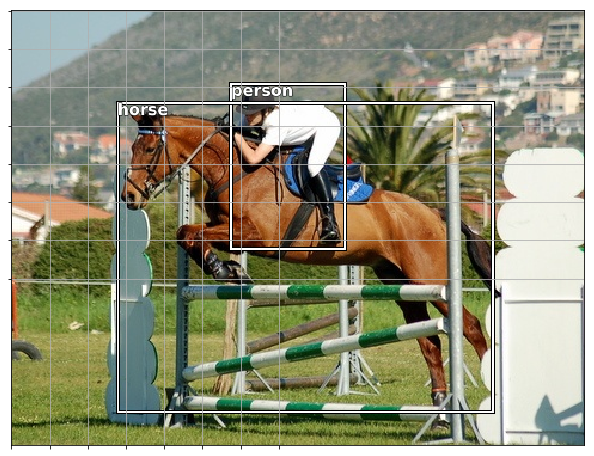

In [19]:
draw_idx(17)

## Step 1: Multi label classification

In [20]:
MULTI_CLASS_CSV = PATH/'tmp/multi_class.csv'

In [21]:
train_annot[17]

[(array([ 61, 184, 198, 278]), 15), (array([ 77,  89, 335, 402]), 13)]

Use a set because we only want the label once, not for every person in an image for instance.

In [22]:
multi_labels = [set([cats[p[1]] for p in train_annot[i]]) for i in train_ids]

In [23]:
multi_labels_string = [' '.join(str(p) for p in o) for o in multi_labels]

In [24]:
df = pd.DataFrame({'fn': [train_fn[o] for o in train_ids], 'clas': multi_labels_string}, columns=['fn', 'clas'])

In [25]:
df.head(2)

,fn,clas
0,000012.jpg,car
1,000017.jpg,person horse


In [26]:
df.to_csv(MULTI_CLASS_CSV, index=False)

In [27]:
model = resnet34
sz = 224
bs = 64

In [28]:
tfms = tfms_from_model(model, sz, crop_type=CropType.NO)

In [29]:
modeldata = ImageClassifierData.from_csv(PATH, JPEGS, MULTI_CLASS_CSV, tfms=tfms)

In [30]:
learn = ConvLearner.pretrained(model, modeldata)

/home/fabiograetz/anaconda3/envs/deeplearning/lib/python3.6/site-packages/fastai/initializers.py:6: UserWarning: nn.init.kaiming_normal is now deprecated in favor of nn.init.kaiming_normal_.
  if hasattr(m, 'weight'): init_fn(m.weight)


In [31]:
learn.opt_fn = optim.Adam

In [32]:
learn.lr_find(start_lr=1e-5, end_lr=100)

epoch      trn_loss   val_loss   <lambda>                  
    0      1.715298   7.197881   0.7395    



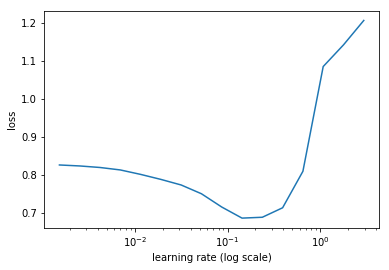

In [33]:
learn.sched.plot()

In [34]:
lr = 2e-2

In [35]:
learn.fit(lrs=lr, n_cycle=1, cycle_len=3, use_clr=(32,5))

epoch      trn_loss   val_loss   <lambda>                  
    0      0.328686   0.133883   0.9548    
    1      0.175165   0.07648    0.9739                    
    2      0.118068   0.073615   0.9743                    



[0.0736148076057434, 0.9743000016212463]

In [36]:
learn.fit(lrs=lr, n_cycle=1, cycle_len=1, use_clr=(32,5))

epoch      trn_loss   val_loss   <lambda>                   
    0      0.08921    0.08411    0.9735    



[0.0841098957657814, 0.973500018119812]

In [37]:
lrs = np.array([lr/100, lr/10, lr])

In [38]:
learn.freeze_to(-2)

In [39]:
learn.lr_find(lrs/1000)

 81%|████████▏ | 26/32 [00:04<00:01,  5.82it/s, loss=0.442] 


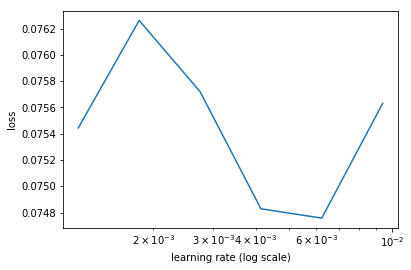

In [40]:
learn.sched.plot(n_skip_end=9)

In [41]:
learn.fit(lrs=lrs/10, n_cycle=1, cycle_len=5, use_clr=(32,5))

epoch      trn_loss   val_loss   <lambda>                   
    0      0.074713   0.080958   0.9737    
    1      0.05672    0.078628   0.976                      
    2      0.041371   0.081853   0.975                      
    3      0.030496   0.077459   0.9756                     
    4      0.021488   0.076584   0.9773                     



[0.07658419632911682, 0.9773000111579895]

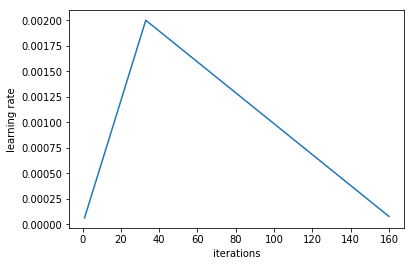

In [42]:
learn.sched.plot_lr()

In [43]:
learn.save('multi_class')

In [44]:
learn.load('multi_class')

In [45]:
y = learn.predict()
x, _ = next(iter(modeldata.val_dl))

In [46]:
x = to_np(x)

In [47]:
x.shape, y.shape

((64, 3, 224, 224), (500, 20))

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


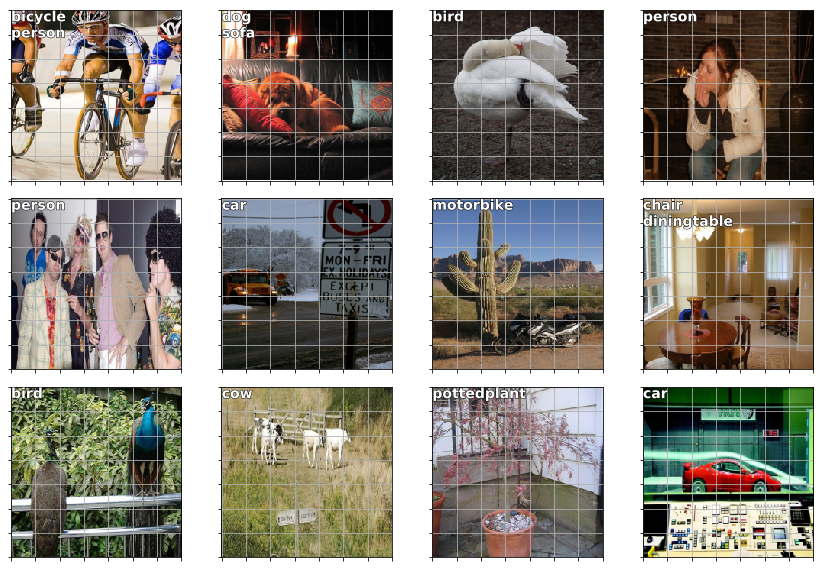

In [48]:
figure, axes = plt.subplots(3, 4, figsize=(12, 8))
for i, ax in enumerate(axes.flat):
    img = modeldata.val_ds.denorm(x)[i]
    yy = np.nonzero(y[i]>0.4)[0]
    lbl = '\n'.join(modeldata.classes[o] for o in yy)
    ax = show_img(img, ax=ax)
    draw_text(ax, (0,0), lbl)
plt.tight_layout()

## Bbox per anchor box

In the notebook "Object detection" we produced an output vector with length $(4 + n_{cats})$ to predict the 4 coordinates of a bounding box and the category of the largest object.

How would we do it if we wanted to predict for example 16 objects with bounding boxes and categories?

1. option: `nn.Linear(n_inp, 16*(4 + n_cats))` which is called Yolo architecture
2. option: use `nn.Conv2d` with `stride=2` to produce an output tensor of the shape (4, 4, 4 + n_cats) which is called SSD architecture.

Look at **receptive field** (lesson 8, min ~38). Keep in mind that the **center** of the receptive field of an activation **has more dependencies**.

### 1. Step: Set up data

In [49]:
CLASS_CSV = PATH/'tmp/class.csv'
MULTIBBOX_CSV = PATH/'tmp/mbb.csv'

In [50]:
model = resnet34
sz = 224
bs = 64

In [51]:
# for every image a list of the included classes
# pay attention:
# multi_class[i] belongs to train_ids[i]
multi_class = [[cats[p[1]] for p in train_annot[o]] for o in train_ids]

In [52]:
id2cat = list(cats.values())

Reduces every id by 1 with respect to `cats`. *Aeroplane* was 1, now its key=0.

In [53]:
cat2id = {v: k for k, v in enumerate(id2cat)}

In [54]:
multi_class_id = np.array([np.array([cat2id[p] for p in o]) for o in multi_class])

In [55]:
multi_class[:2], multi_class_id[:2]

([['car'], ['person', 'horse']],
 array([array([6]), array([14, 12])], dtype=object))

In [56]:
id2cat[6], id2cat[14], id2cat[12]

('car', 'person', 'horse')

For index i `train_ids[i]` returns the id of the image, `multi_class[i]` the classes of the contained objects in form of words and `multi_class_id[id]` the classes in form of indices.

**Validation set:**

In [57]:
val_idxs = get_cv_idxs(len(train_fn))

Split `multi_class_id` into train and validation set:

In [58]:
((val_multi_class_id, trn_multi_class_id),) = split_by_idx(val_idxs, multi_class_id)

In [59]:
len(val_multi_class_id), len(trn_multi_class_id)

(500, 2001)

For every image, simply concatenate the coordinates of all bounding boxes together. We do this because we can join them to a string and later use the fastai `ImageClassifierData.from_csv`.

In [60]:
multi_bbox = [np.concatenate([p[0] for p in train_annot[o]]) for o in train_ids]

multi_bbox_str = [' '.join(str(p) for p in o) for o in multi_bbox]

In [61]:
df = pd.DataFrame({'fn': [train_fn[i] for i in train_ids], 'bbox': multi_bbox_str}, columns=['fn', 'bbox'])
df.to_csv(MULTIBBOX_CSV, index=False)

**Check the dataframe contains the right things:**

In [62]:
train_fn[12]

'000012.jpg'

In [63]:
multi_bbox[0]

array([ 96, 155, 269, 350])

In [64]:
train_annot[12], train_fn[12]

([(array([ 96, 155, 269, 350]), 7)], '000012.jpg')

In [65]:
df.head(2)

,fn,bbox
0,000012.jpg,96 155 269 350
1,000017.jpg,61 184 198 278 77 89 335 402


In [66]:
aug_tfms = [
    RandomRotate(3, p=0.5, tfm_y=TfmType.COORD),
    RandomLighting(0.05, 0.05, tfm_y=TfmType.COORD),
    RandomFlip(tfm_y=TfmType.COORD)
]

In [67]:
tfms = tfms_from_model(model, sz, crop_type=CropType.NO, tfm_y=TfmType.COORD, aug_tfms=aug_tfms)

`continuous=True` because we regress the bounding box coordinates.

In [68]:
modeldata = ImageClassifierData.from_csv(PATH, JPEGS, MULTIBBOX_CSV, tfms=tfms, val_idxs=val_idxs, continuous=True, num_workers=4)

#### Concatenate the two datasets: categories and bounding boxes

In [69]:
class ConcatLabelBBoxDataset(Dataset):
    def __init__(self, ds, lbl2):
        self.ds, self.lbl2 = ds, lbl2
        self.sz = ds.sz

    def __len__(self):
        return len(self.ds)
    
    def __getitem__(self, i):
        x, y = self.ds[i]
        y2 = self.lbl2[i]
        return (x, (y, y2))

In [70]:
trn_ds2 = ConcatLabelBBoxDataset(modeldata.trn_ds, trn_multi_class_id)

val_ds2 = ConcatLabelBBoxDataset(modeldata.val_ds, val_multi_class_id)

**Replace the dataset with the combined dataset containing both the bounding boxes and the categories.**

In [71]:
modeldata.trn_dl.dataset = trn_ds2
modeldata.val_dl.dataset = val_ds2

#### Let's take a look at the return values of the dataloaders to check everything is right!

In [72]:
x, y = next(iter(modeldata.val_dl))
x = x.data.cpu().numpy()
x = modeldata.val_ds.ds.denorm(x)

In [73]:
x, y = next(iter(modeldata.trn_dl))
x = x.data.cpu().numpy()
x = modeldata.val_ds.ds.denorm(x)

In [74]:
import matplotlib.cm as cmx
import matplotlib.colors as mcolors
from cycler import cycler

def get_cmap(N):
    '''Return N different RGBA colors'''
    color_norm = mcolors.Normalize(vmin=0, vmax=N-1)
    return cmx.ScalarMappable(norm=color_norm, cmap='Set3').to_rgba

num_colors = 12
cmap = get_cmap(num_colors)
color_list = [cmap(float(x)) for x in range(num_colors)]

In [75]:
def show_ground_truth(ax, im, bbox, clas=None, prs=None, thresh=0.3):
    bb = [convert_bb_to_VOC(o) for o in bbox.reshape(-1,4)]
    if prs is None:  prs  = [None]*len(bb)
    if clas is None: clas = [None]*len(bb)
    ax = show_img(im, ax=ax)
    for i,(b,c,pr) in enumerate(zip(bb, clas, prs)):
        if(c != 0 and (b[2]>0) and (pr is None or pr > thresh)):
            draw_rect(ax, b, color=color_list[i%num_colors])
            txt = f'{i}: '
            if c is not None: txt += ('bg' if c==len(id2cat) else id2cat[c])
            if pr is not None: txt += f' {pr:.2f}'
            draw_text(ax, b[:2], txt, color=color_list[i%num_colors])

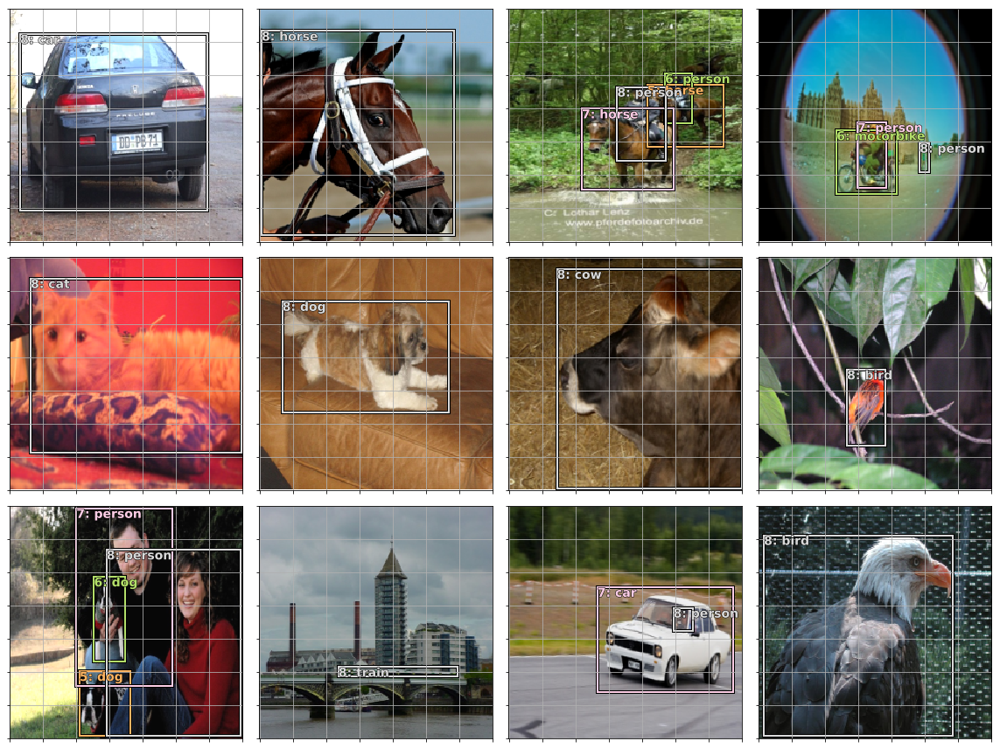

In [76]:
fig, axes = plt.subplots(3, 4, figsize=(16, 12))
for i, ax in enumerate(axes.flat):
    show_ground_truth(ax, x[i], y[0][i], y[1][i])
plt.tight_layout()

### 2. Step: Build an architecture

In [77]:
k = 1

In [78]:
n_classes = len(id2cat) + 1  # for 'background'
n_activations = k * (4 + n_classes)  # for bbox coordinates + classes

class StandardConv(nn.Module):
    def __init__(self, n_in, n_out, stride=2, drop=0.1):
        super().__init__()
        self.conv = nn.Conv2d(n_in, n_out, kernel_size=3, stride=stride, padding=1)
        self.bn = nn.BatchNorm2d(n_out)
        self.drop = nn.Dropout(drop)
        
    def forward(self, x):
        return self.drop(self.bn(F.relu(self.conv(x))))
    
def flatten_conv(x, k):
    bs, nf, gx, gy = x.size()
    x = x.permute(0,2,3,1).contiguous()
    return x.view(bs, -1, nf//k)

class OutConv(nn.Module):
    def __init__(self, k, n_in, bias):
        super(). __init__()
        self.k = k
        
        # Prediction of classes
        self.oconv1 = nn.Conv2d(n_in, n_classes * k, kernel_size=3, padding=1)
        
        # Prediction of bbox coordinates
        self.oconv2 = nn.Conv2d(n_in, 4 * k, kernel_size=3, padding=1)
        self.oconv1.bias.data.zero_().add_(bias)
        
    def forward(self, x):
        return [flatten_conv(self.oconv1(x), self.k),
               flatten_conv(self.oconv2(x), self.k)]

class SSD_Head(nn.Module):
    def __init__(self, k, bias):
        super().__init__()
        self.drop = nn.Dropout(0.25)
        self.sconv0 = StandardConv(512, 256, stride=1)  # keeps size the same because of padding
        self.sconv1 = StandardConv(256, 256)  # reduces size by factor of 2 because of stride=2
        self.out = OutConv(k, 256, bias)
    
    def forward(self, x):
        x = self.drop(F.relu(x))
        x = self.sconv0(x)
        x = self.sconv1(x)
        return self.out(x)

In [79]:
custom_head = SSD_Head(k, -3.)
new_model = ConvnetBuilder(model, 0, 0, 0, 0, custom_head=custom_head)

learn = ConvLearner(modeldata, new_model)
learn.opt_fn = optim.Adam

In [80]:
x, y = next(iter(modeldata.val_dl))
x, y = V(x), V(y)

In [81]:
learn.model.eval()

Sequential(
  (0): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (2): ReLU(inplace)
  (3): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (4): Sequential(
    (0): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
    (1): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace)
      (conv2): Conv2d(64, 64, ker

In [82]:
batch = learn.model(x)

In [83]:
predicted_classes, predicted_bboxes = batch

**Output shapes:**

In [84]:
predicted_classes.size(), predicted_bboxes.size()

(torch.Size([64, 16, 21]), torch.Size([64, 16, 4]))

### 3. Step: Define a custom loss function - Matching problem

1. Match the ground truth bounding boxes in the image to (at least) one of the default boxes by calculating the *Jaccard index* (area of overlap / area of union).
1. Each default box is responsible to predict the category of the object in the box (its receptive field) and the offset of the ground truth bounding box to the default box.

In [85]:
anc_grid = 4

anc_offset = 1/(anc_grid * 2)
anc_x = np.repeat(np.linspace(start=anc_offset, stop=1-anc_offset, num=anc_grid), anc_grid)

anc_y = np.tile(np.linspace(start=anc_offset, stop=1-anc_offset, num=anc_grid), anc_grid)

In [86]:
anc_centers = np.tile(np.stack([anc_x, anc_y], axis=1), (k,1))

In [87]:
anc_sizes = np.array([[1/anc_grid, 1/anc_grid] for i in range(anc_grid*anc_grid)])

In [88]:
anchors = V(np.concatenate([anc_centers, anc_sizes], axis=1), requires_grad=False).float()

In [89]:
anchors

tensor([[0.1250, 0.1250, 0.2500, 0.2500],
        [0.1250, 0.3750, 0.2500, 0.2500],
        [0.1250, 0.6250, 0.2500, 0.2500],
        [0.1250, 0.8750, 0.2500, 0.2500],
        [0.3750, 0.1250, 0.2500, 0.2500],
        [0.3750, 0.3750, 0.2500, 0.2500],
        [0.3750, 0.6250, 0.2500, 0.2500],
        [0.3750, 0.8750, 0.2500, 0.2500],
        [0.6250, 0.1250, 0.2500, 0.2500],
        [0.6250, 0.3750, 0.2500, 0.2500],
        [0.6250, 0.6250, 0.2500, 0.2500],
        [0.6250, 0.8750, 0.2500, 0.2500],
        [0.8750, 0.1250, 0.2500, 0.2500],
        [0.8750, 0.3750, 0.2500, 0.2500],
        [0.8750, 0.6250, 0.2500, 0.2500],
        [0.8750, 0.8750, 0.2500, 0.2500]], device='cuda:0')

In [90]:
grid_sizes = V(np.array([1/anc_grid]), requires_grad=False).unsqueeze(1)

In [91]:
grid_sizes

tensor([[0.2500]], device='cuda:0')

#### Center of the *default boxes*

(0, 1)

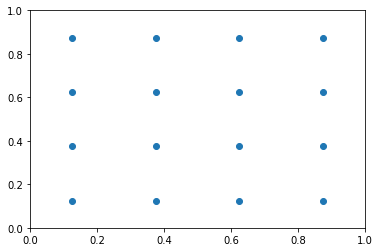

In [92]:
plt.scatter(anc_x, anc_y, )
plt.xlim(0, 1)
plt.ylim(0, 1)

#### Convert *center and size* to *corners*:

In [93]:
def hw2corners(center, hw):
    return torch.cat([center-hw/2, center+hw/2], dim=1)

In [94]:
anchor_corners = hw2corners(anchors[:, :2], anchors[:, 2:])

(0, 1)

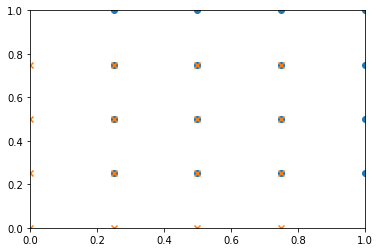

In [95]:
plt.scatter(anchor_corners[:, 2], anchor_corners[:, 3])
plt.scatter(anchor_corners[:, 0], anchor_corners[:, 1],marker='x')
plt.xlim(0, 1)
plt.ylim(0, 1)

In [96]:
anchor_corners

tensor([[0.0000, 0.0000, 0.2500, 0.2500],
        [0.0000, 0.2500, 0.2500, 0.5000],
        [0.0000, 0.5000, 0.2500, 0.7500],
        [0.0000, 0.7500, 0.2500, 1.0000],
        [0.2500, 0.0000, 0.5000, 0.2500],
        [0.2500, 0.2500, 0.5000, 0.5000],
        [0.2500, 0.5000, 0.5000, 0.7500],
        [0.2500, 0.7500, 0.5000, 1.0000],
        [0.5000, 0.0000, 0.7500, 0.2500],
        [0.5000, 0.2500, 0.7500, 0.5000],
        [0.5000, 0.5000, 0.7500, 0.7500],
        [0.5000, 0.7500, 0.7500, 1.0000],
        [0.7500, 0.0000, 1.0000, 0.2500],
        [0.7500, 0.2500, 1.0000, 0.5000],
        [0.7500, 0.5000, 1.0000, 0.7500],
        [0.7500, 0.7500, 1.0000, 1.0000]], device='cuda:0')

Columns 0 and 1 are the x and y coords of the lower left corner of the bb respectively. Columns 2 and 3 the x and y coords of the top right corners.

#### Let's look at how the bounding boxes of a specific image are mapped to the default boxes

In [97]:
x, y = next(iter(modeldata.val_dl))
x, y = V(x), V(y)

In [98]:
idx = 7

In [99]:
def get_y(bbox,clas):
    bbox = bbox.view(-1,4)/sz
    bb_keep = ((bbox[:,2]-bbox[:,0])>0).nonzero()[:,0]  # delete the bounding boxes that have zero width
    return bbox[bb_keep], clas[bb_keep]

**In different images we can have different number of ground truth objects. Many implementation therefore work one example at a time, instead of minibatches. Fastai padds with zeros, so that we get rectangular shape for a minibatch and can construct a tensor... The function `get_y` removes the padding by deleting ground truth objects whose boxes have a with of 0.**

#### Ground truth bounding boxes and classes

In [100]:
img = modeldata.val_ds.ds.denorm(to_np(x))[idx]
bbox,clas = get_y(y[0][idx], y[1][idx])
bbox, clas

(tensor([[0.6786, 0.4866, 0.9911, 0.6250],
         [0.7098, 0.0848, 0.9911, 0.5491],
         [0.5134, 0.8304, 0.6696, 0.9063]], device='cuda:0'),
 tensor([ 8, 10, 17], device='cuda:0'))

In [101]:
def plot_gt(ax, img, bbox, clas, prs=None, thresh=0.4):
    return show_ground_truth(ax, img, to_np(bbox*224), to_np(clas) if clas is not None else None, to_np(prs) if prs is not None else None, thresh)

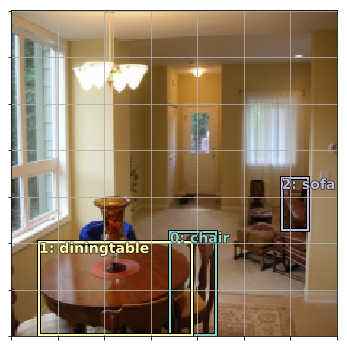

In [102]:
fig, ax = plt.subplots(figsize=(6,6))
plot_gt(ax, img, bbox, clas)

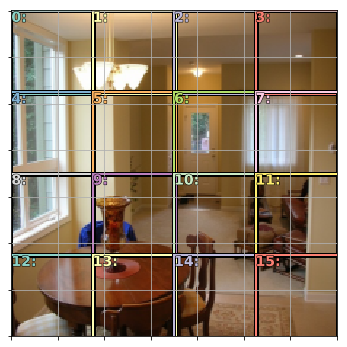

In [103]:
fig, ax = plt.subplots(figsize=(6,6))
plot_gt(ax, img, anchor_corners, None)

#### Calculate the *Jaccard index*

In [104]:
anchor_corners

tensor([[0.0000, 0.0000, 0.2500, 0.2500],
        [0.0000, 0.2500, 0.2500, 0.5000],
        [0.0000, 0.5000, 0.2500, 0.7500],
        [0.0000, 0.7500, 0.2500, 1.0000],
        [0.2500, 0.0000, 0.5000, 0.2500],
        [0.2500, 0.2500, 0.5000, 0.5000],
        [0.2500, 0.5000, 0.5000, 0.7500],
        [0.2500, 0.7500, 0.5000, 1.0000],
        [0.5000, 0.0000, 0.7500, 0.2500],
        [0.5000, 0.2500, 0.7500, 0.5000],
        [0.5000, 0.5000, 0.7500, 0.7500],
        [0.5000, 0.7500, 0.7500, 1.0000],
        [0.7500, 0.0000, 1.0000, 0.2500],
        [0.7500, 0.2500, 1.0000, 0.5000],
        [0.7500, 0.5000, 1.0000, 0.7500],
        [0.7500, 0.7500, 1.0000, 1.0000]], device='cuda:0')

In [105]:
bbox.data

tensor([[0.6786, 0.4866, 0.9911, 0.6250],
        [0.7098, 0.0848, 0.9911, 0.5491],
        [0.5134, 0.8304, 0.6696, 0.9063]], device='cuda:0')

In [106]:
# box_b will be anchor_corners
def intersect(box_a, box_b):
    max_xy = torch.min(box_a[:, None, 2:], box_b[None, :, 2:])
    min_xy = torch.max(box_a[:, None, :2], box_b[None, :, :2])
    inter = torch.clamp((max_xy - min_xy), min=0)
    return inter[:, :, 0] * inter[:, :, 1]

def box_sz(b):
    return ((b[:, 2]-b[:, 0]) * (b[:, 3]-b[:, 1]))  # width * height

def jaccard(box_a, box_b):
    inter = intersect(box_a, box_b)
    union = box_sz(box_a).unsqueeze(1) + box_sz(box_b).unsqueeze(0) - inter
    return inter / union

#### For each of the 3 ground truth bounding boxes in the example image `overlaps` contains the jaccard index with each of the 16 default boxes

In [107]:
overlaps = jaccard(bbox.data, anchor_corners.data)
overlaps

tensor([[0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000,
         0.0091, 0.0922, 0.0000, 0.0000, 0.0315, 0.3985, 0.0000],
        [0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0356,
         0.0549, 0.0103, 0.0000, 0.2598, 0.4538, 0.0653, 0.0000],
        [0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000,
         0.0000, 0.0000, 0.1897, 0.0000, 0.0000, 0.0000, 0.0000]],
       device='cuda:0')

#### We match in two different ways:
1. Each bounding box is matched to the default box with which it has the highest overlap (row-wise `max(1)`). This guarantees that every bbox is matched to at least one default box.
1. If the highest overlap a default box has is higher than a certain threshold, it is matched to the corresponding bbox as well (colum-wise `max(0)`).

In [108]:
overlaps.max(1)

(tensor([0.3985, 0.4538, 0.1897], device='cuda:0'),
 tensor([14, 13, 11], device='cuda:0'))

#### Default boxes 14, 13, 11 have a match with ground truth bbox 0, 1, and 2, respectively.

In [109]:
overlaps.max(0)

(tensor([0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0356,
         0.0549, 0.0922, 0.1897, 0.2598, 0.4538, 0.3985, 0.0000],
        device='cuda:0'),
 tensor([0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 2, 1, 1, 0, 0], device='cuda:0'))

#### This contains the largest overlap for every default box (and the idx of the respective gt object). Only the overlaps that cross a certain threshold will be considered a match!

### Let's combine this into a function:
Assigns each default box to a ground truth object (as described in SSD paper).

In [110]:
def map_to_ground_truth(overlaps):
    # direct match: for each gt bbox find default box with max overlap
    direct_overlap, direct_idx = overlaps.max(1)  
    # for each default box: find largest overlap, has to be larger than treshold
    gt_overlap, gt_idx = overlaps.max(0)          
    # ensure that boxes that have been matched by max(1) surpass the threshold
    gt_overlap[direct_idx] = 1.99
    # and make sure that gt_idx contains the index of the respective row
    for i, o in enumerate(direct_idx): gt_idx[o] = i
    return gt_overlap, gt_idx
#gt_overlap contains the jaccard indices for every default box. The direct matches have a value that surpases the threshold. gt_idx contains the row (and thus the class) that the highest overlap was measured with

In [111]:
gt_overlap,gt_idx = map_to_ground_truth(overlaps)
gt_overlap,gt_idx

(tensor([0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0356,
         0.0549, 0.0922, 1.9900, 0.2598, 1.9900, 1.9900, 0.0000],
        device='cuda:0'),
 tensor([0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 2, 1, 1, 0, 0], device='cuda:0'))

#### Let's check for which default boxes the overlap was larger than the threshold:

In [112]:
thresh = 0.5
pos = gt_overlap > thresh
pos_idx = torch.nonzero(pos)[:, 0]   # indices of default boxes that surpassed the threshold
neg_idx = torch.nonzero(1-pos)[:, 0] # indices of default boxes that didn't, are considered to contain background

In [113]:
pos_idx

tensor([11, 13, 14], device='cuda:0')

In [114]:
neg_idx

tensor([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 12, 15], device='cuda:0')

#### Map this to classes

In [115]:
clas

tensor([ 8, 10, 17], device='cuda:0')

In [116]:
gt_clas = clas[gt_idx]
gt_clas

tensor([ 8,  8,  8,  8,  8,  8,  8,  8, 10, 10,  8, 17, 10, 10,  8,  8],
       device='cuda:0')

In [117]:
gt_clas[1-pos] = len(id2cat)  # the default boxes that are not matched are set to background

In [118]:
[id2cat[o] if o<len(id2cat) else "bg" for o in gt_clas.data]

['bg',
 'bg',
 'bg',
 'bg',
 'bg',
 'bg',
 'bg',
 'bg',
 'bg',
 'bg',
 'bg',
 'sofa',
 'bg',
 'diningtable',
 'chair',
 'bg']

#### The activations predict the offset that is needed with respect to the default box to arrive at the ground truth bounding box.

Let's define a function that converts activations to predicted bounding box coordinates:

The first two columns of `anchors` contain the x and y coords of the centers of the default boxes. The last two columns the heights and widths (all the same) of the default boxes.

In [119]:
grid_sizes

tensor([[0.2500]], device='cuda:0')

In [120]:
def act_to_bb(actn, anchors):
    actn_bbs = torch.tanh(actn)  # maps from -1 to 1
    # max variation is plus/minus half of grid size; plus center coords of anchors
    act_centers = (actn_bbs[:, :2]/2 * grid_sizes) + anchors[:, :2]  # center of predicted bounding box
    # value between 0.5 and 1.5 times the height and with of default box
    actn_height_width = (actn_bbs[:, 2:]/2+1) * anchors[:, 2:]       # predicted height and width of bbox
    return hw2corners(act_centers, actn_height_width)   # convert to corner representation

#### This function allows us to map the activations to the predicted bbox coordinates

### We now succesfully matched the labels to the default boxes and the activations to the predicted bbox coordinates. Time to formulate the loss function which consists of two parts

1. Bounding boxes: L1 loss
1. Classes: Cross entropy loss


In [329]:
def one_hot_embedding(labels, num_classes):
    return torch.eye(num_classes)[labels.data.cpu()]

class BCE_Loss(nn.Module):  # Binary cross entropy
    def __init__(self, num_classes):
        super().__init__()
        self.num_classes = num_classes
        
    def forward(self, pred, targ):
        t = one_hot_embedding(targ, self.num_classes + 1)  # +1 for background
        t = V(t[:, :-1].contiguous())  # -1 to exclude the background
        # t has at most one 1 if there is an object in the default box or only 0's if it is background
        x = pred[:, :-1]
        w = self.get_weight(x, t)
        #pdb.set_trace()
        return F.binary_cross_entropy_with_logits(x, t, w, size_average=False)/self.num_classes
    
    def get_weight(self, x, t): return None
    
loss_f = BCE_Loss(len(id2cat))

#### Important tweak:
Note, that we do not ask the neural net using softmax whether a cell contains only background (as its own category) because it is a very difficult task for a neural net to decide if none of the classes we are interested in is found in the default box. It is much simpler for the net to decide "is there a car", "is there a tree" and if none of these questions have the answer "true", it must be background. That is why we exclude the column "background" before calculating the binary cross entropy loss. After removing the background column, we do not use categorical cross entropy because it implies softmax and softmax was designed to pick one single class but here we want the possibility to not pick a class at all.

In [351]:
def ssd_1_loss(b_c,b_bb,bbox,clas):
    bbox,clas = get_y(bbox,clas)   # removes padding by only leaving the labels with bbox_width > 0
    a_ic = act_to_bb(b_bb, anchors)  # converts the  activations to the predicted bbox coords
    # overlaps
    overlaps = jaccard(bbox.data, anchor_corners.data)
    gt_overlap,gt_idx = map_to_ground_truth(overlaps)
    gt_clas = clas[gt_idx]   # gt_clas has class idx for every default box
    pos = gt_overlap > 0.4   # overlap needs to be larger than threshold to be considered match
    pos_idx = torch.nonzero(pos)[:,0]   # indices of default boxes that surpassed the threshold
    gt_clas[1-pos] = len(id2cat)        # the default boxes that are not matched are set to background 
    gt_bbox = bbox[gt_idx]   # for every default box index, the gt_bbox that was matched to it
    # pdb.set_trace()       # gt_bbox[pox_idx] leaves only the ones that were actually matched
    loc_loss = ((a_ic[pos_idx] - gt_bbox[pos_idx]).abs()).mean()   # L1 loss for predicted bboxes
    clas_loss  = loss_f(b_c, gt_clas)
    return loc_loss, clas_loss

In [352]:
def ssd_loss(pred, targ):
    cls, lls = 0., 0.
    for pred_c, pred_bb_act, bbox, clas in zip(*pred, *targ):  # for every idx in the minibatch
        loc_loss, clas_loss = ssd_1_loss(pred_c, pred_bb_act, bbox, clas)
        lls += loc_loss
        cls += clas_loss
        
    return lls + cls

In [124]:
x,y = next(iter(modeldata.val_dl))
x,y = V(x),V(y)

In [125]:
for i,o in enumerate(y): y[i] = o.cuda()
learn.model.cuda()

Sequential(
  (0): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (2): ReLU(inplace)
  (3): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (4): Sequential(
    (0): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
    (1): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace)
      (conv2): Conv2d(64, 64, ker

In [126]:
batch = learn.model(x)

In [127]:
ssd_loss(batch, y)

/home/fabiograetz/anaconda3/envs/deeplearning/lib/python3.6/site-packages/torch/nn/functional.py:52: UserWarning: size_average and reduce args will be deprecated, please use reduction='sum' instead.
  warnings.warn(warning.format(ret))


tensor(81.0346, device='cuda:0', grad_fn=<ThAddBackward>)

#### Loss function seems to work

In [128]:
learn.crit = ssd_loss

In [129]:
learn.lr_find(lr/1000,1.)

  0%|          | 0/32 [00:00<?, ?it/s]

/home/fabiograetz/anaconda3/envs/deeplearning/lib/python3.6/site-packages/torch/nn/functional.py:52: UserWarning: size_average and reduce args will be deprecated, please use reduction='sum' instead.
  warnings.warn(warning.format(ret))


epoch      trn_loss   val_loss                            
    0      123.9315   12116.87275



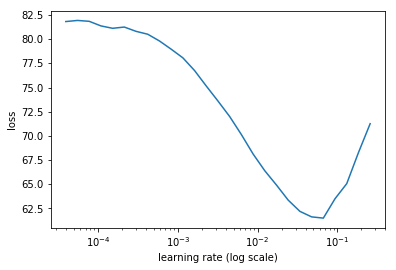

In [130]:
learn.sched.plot(n_skip=2, n_skip_end=2)

In [131]:
lr = 3e-3

In [132]:
learn.fit(lrs=lr, n_cycle=1, cycle_len=5, use_clr=(20,10))

  0%|          | 0/32 [00:00<?, ?it/s]

/home/fabiograetz/anaconda3/envs/deeplearning/lib/python3.6/site-packages/torch/nn/functional.py:52: UserWarning: size_average and reduce args will be deprecated, please use reduction='sum' instead.
  warnings.warn(warning.format(ret))


epoch      trn_loss   val_loss                            
    0      43.06758   32.364132 
    1      33.737106  28.442311                           
    2      29.473309  27.064914                           
    3      26.737361  26.347674                           
    4      24.524378  25.721186                           



[25.721185989379883]

In [133]:
learn.save('model_0')

In [134]:
learn.load('model_0')

### Let's look at a few predicted bounding boxes:

In [135]:
x,y = next(iter(modeldata.val_dl))
x,y = V(x),V(y)
learn.model.eval()
batch = learn.model(x)
b_clas,b_bb = batch

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


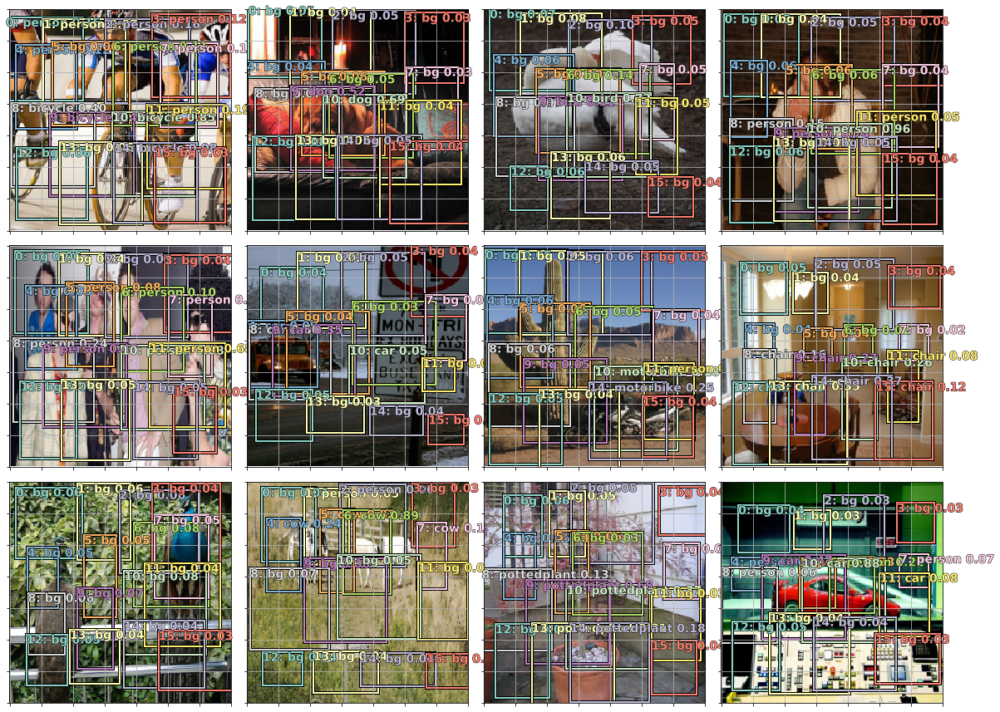

In [136]:
fig, axes = plt.subplots(3, 4, figsize=(16, 12))
for idx,ax in enumerate(axes.flat):
    ima=modeldata.val_ds.ds.denorm(to_np(x))[idx]
    bbox,clas = get_y(y[0][idx], y[1][idx])
    ima=modeldata.val_ds.ds.denorm(to_np(x))[idx]
    bbox,clas = get_y(bbox,clas); bbox,clas
    a_ic = act_to_bb(b_bb[idx], anchors)
    plot_gt(ax, ima, a_ic, b_clas[idx].max(1)[1], b_clas[idx].max(1)[0].sigmoid(), 0.01)
plt.tight_layout()

**This already looks promising. However, in the potted plant example, the bounding boxes are much too small! The reason is, that the bounding boxes can be only 50% larger than the default boxes. Solution: More default boxes with different sizes.**

## More default boxes

1. Different grid sizes
1. Different zooms
1. Different aspect ratios

In [137]:
default_grids = [4, 2, 1]
default_zooms = [0.7, 1., 1.3]
default_ratios = [(1., 1.), (1., 0.5), (0.5, 1.)]

# combine aspect ratios with zooms
default_scales = [(zoom * i, zoom * j) for zoom in default_zooms for (i, j) in default_ratios]

In [138]:
default_scales

[(0.7, 0.7),
 (0.7, 0.35),
 (0.35, 0.7),
 (1.0, 1.0),
 (1.0, 0.5),
 (0.5, 1.0),
 (1.3, 1.3),
 (1.3, 0.65),
 (0.65, 1.3)]

In [139]:
k = len(default_scales)
k

9

In [140]:
default_offsets = [1/(2 * o) for o in default_grids]
default_offsets

[0.125, 0.25, 0.5]

**Let's create the grids**

```
>>> x = np.array([[1,2],[3,4]])
>>> np.repeat(x, 2)
array([1, 1, 2, 2, 3, 3, 4, 4])
```
and 
```
>>> a = np.array([0, 1, 2])
>>> np.tile(a, 2)
array([0, 1, 2, 0, 1, 2])
```

In [141]:
default_x = np.concatenate([np.repeat(np.linspace(offset, 1 - offset, grid), grid) for offset, grid in zip(default_offsets, default_grids)])

default_y = np.concatenate([np.tile(np.linspace(offset, 1 - offset, grid), grid) for offset, grid in zip(default_offsets, default_grids)])

In [142]:
default_x

array([0.125, 0.125, 0.125, 0.125, 0.375, 0.375, 0.375, 0.375, 0.625, 0.625, 0.625, 0.625, 0.875, 0.875,
       0.875, 0.875, 0.25 , 0.25 , 0.75 , 0.75 , 0.5  ])

In [143]:
default_y

array([0.125, 0.375, 0.625, 0.875, 0.125, 0.375, 0.625, 0.875, 0.125, 0.375, 0.625, 0.875, 0.125, 0.375,
       0.625, 0.875, 0.25 , 0.75 , 0.25 , 0.75 , 0.5  ])

In [144]:
default_centers = np.repeat(np.stack([default_x, default_y], axis=1), k, axis=0)
# repeat k times for zooms/aspect ratios

In [145]:
np.stack([default_x, default_y], axis=1)  # 21 centers: 4x4 + 2x2 + 1x1

array([[0.125, 0.125],
       [0.125, 0.375],
       [0.125, 0.625],
       [0.125, 0.875],
       [0.375, 0.125],
       [0.375, 0.375],
       [0.375, 0.625],
       [0.375, 0.875],
       [0.625, 0.125],
       [0.625, 0.375],
       [0.625, 0.625],
       [0.625, 0.875],
       [0.875, 0.125],
       [0.875, 0.375],
       [0.875, 0.625],
       [0.875, 0.875],
       [0.25 , 0.25 ],
       [0.25 , 0.75 ],
       [0.75 , 0.25 ],
       [0.75 , 0.75 ],
       [0.5  , 0.5  ]])

In [146]:
default_sizes = np.concatenate([np.array([[scale_x/grid, scale_y/grid] for i in range(grid*grid) for scale_x, scale_y in default_scales]) for grid in default_grids])

In [200]:
grid_sizes = V(np.concatenate([np.array([ 1/grid       for i in range(grid*grid) for scale_x, scale_y in default_scales])
               for grid in default_grids]), requires_grad=False).unsqueeze(1)

In [148]:
anchors = V(np.concatenate([default_centers, default_sizes], axis=1), requires_grad=False).float()
anchor_corners = hw2corners(anchors[:, :2], anchors[:, 2:])

In [149]:
anchors

tensor([[0.1250, 0.1250, 0.1750, 0.1750],
        [0.1250, 0.1250, 0.1750, 0.0875],
        [0.1250, 0.1250, 0.0875, 0.1750],
        [0.1250, 0.1250, 0.2500, 0.2500],
        [0.1250, 0.1250, 0.2500, 0.1250],
        [0.1250, 0.1250, 0.1250, 0.2500],
        [0.1250, 0.1250, 0.3250, 0.3250],
        [0.1250, 0.1250, 0.3250, 0.1625],
        [0.1250, 0.1250, 0.1625, 0.3250],
        [0.1250, 0.3750, 0.1750, 0.1750],
        [0.1250, 0.3750, 0.1750, 0.0875],
        [0.1250, 0.3750, 0.0875, 0.1750],
        [0.1250, 0.3750, 0.2500, 0.2500],
        [0.1250, 0.3750, 0.2500, 0.1250],
        [0.1250, 0.3750, 0.1250, 0.2500],
        [0.1250, 0.3750, 0.3250, 0.3250],
        [0.1250, 0.3750, 0.3250, 0.1625],
        [0.1250, 0.3750, 0.1625, 0.3250],
        [0.1250, 0.6250, 0.1750, 0.1750],
        [0.1250, 0.6250, 0.1750, 0.0875],
        [0.1250, 0.6250, 0.0875, 0.1750],
        [0.1250, 0.6250, 0.2500, 0.2500],
        [0.1250, 0.6250, 0.2500, 0.1250],
        [0.1250, 0.6250, 0.1250, 0

**These are the centers of our default boxes**

(0, 1)

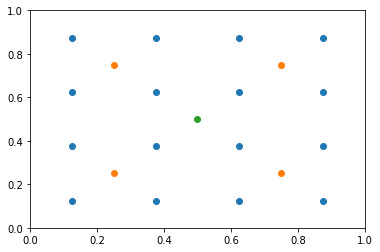

In [150]:
plt.scatter(default_x[:16], default_y[:16])
plt.scatter(default_x[16:-1], default_y[16:-1])
plt.scatter(default_x[-1], default_y[-1])
plt.xlim(0, 1)
plt.ylim(0, 1)

**These are the boxes themselves**

In [151]:
x, y = to_np(next(iter(modeldata.val_dl)))
x = modeldata.val_ds.ds.denorm(x)

Add some noise so that the frames of the default boxes don't lie on top of each other and we can see them..

In [152]:
boxes = np.reshape((to_np(anchor_corners) + to_np(torch.randn(*anchor_corners.size()))*0.01)*224, -1)

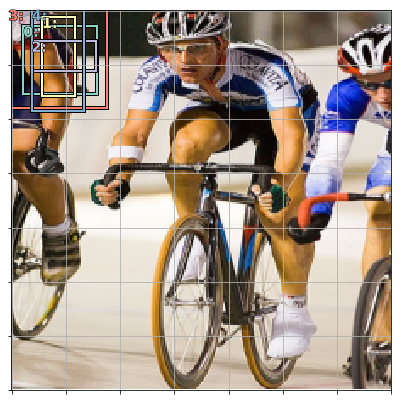

In [153]:
fig, ax = plt.subplots(figsize=(7, 7))
show_ground_truth(ax, x[0], boxes[:20])

### Model

In [353]:
class SSD_MultiHead(nn.Module):
    def __init__(self, k, bias, drop=0.4):
        super().__init__()
        self.drop = nn.Dropout(drop)
        # Stride 1, kernel_size=3 and padding=1 leaves the size the same
        self.sconv0 = StandardConv(512, 256, stride=1, drop=drop)
        # Stride 2 convolutions reduces the size to half each time
        self.sconv1 = StandardConv(256, 256, drop=drop)   # 4x4
        self.sconv2 = StandardConv(256, 256, drop=drop)   # 2x2
        self.sconv3 = StandardConv(256, 256, drop=drop)   # 1x1
        
        self.out0 = OutConv(k, 256, bias)
        self.out1 = OutConv(k, 256, bias)
        self.out2 = OutConv(k, 256, bias)
        self.out3 = OutConv(k, 256, bias)
        
    def forward(self, x):
        x = self.drop(F.relu(x))
        x = self.sconv0(x)
        x = self.sconv1(x)
        out1clas, out1bb = self.out1(x)  # 4x4
        
        x = self.sconv2(x)
        out2clas, out2bb = self.out2(x)  # 2x2
        
        x = self.sconv3(x)
        out3clas, out3bb = self.out3(x)  # 1x1
        
        return [torch.cat([out1clas, out2clas, out3clas], dim=1),
                torch.cat([out1bb, out2bb, out3bb], dim=1)]

In [354]:
custom_head2 = SSD_MultiHead(k, -4., 0.5)
new_model2 = ConvnetBuilder(model, 0, 0, 0, 0, custom_head=custom_head2)
learn = ConvLearner(modeldata, new_model2)
learn.opt_fn = optim.Adam

In [355]:
learn.crit = ssd_loss

#### Let's make sure the shapes make sense:

In [335]:
x, y = next(iter(modeldata.val_dl))
x, y = V(x), V(y)
pred_classes, pred_bboxes = learn.model(x)

In [336]:
pred_classes.shape, pred_bboxes.shape, len(anchors)

(torch.Size([64, 189, 21]), torch.Size([64, 189, 4]), 189)

#### They do make sense: batch size = 64, 189 default boxes, 21 classes and 4 coordinates for the bounding boxes

In [337]:
learn.lr_find()

  0%|          | 0/32 [00:00<?, ?it/s]

/home/fabiograetz/anaconda3/envs/deeplearning/lib/python3.6/site-packages/torch/nn/functional.py:52: UserWarning: size_average and reduce args will be deprecated, please use reduction='sum' instead.
  warnings.warn(warning.format(ret))


 81%|████████▏ | 26/32 [00:10<00:02,  2.40it/s, loss=1.71e+03]

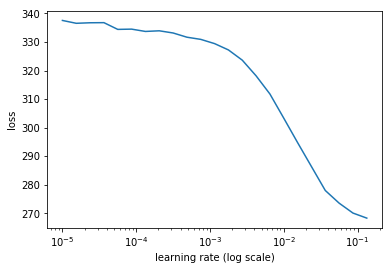

In [338]:
learn.sched.plot(n_skip=0, n_skip_end=2)

In [339]:
lr = 1e-2

In [340]:
learn.fit(lrs=lr, n_cycle=1, cycle_len=5, use_clr=(20, 8))

  0%|          | 0/32 [00:00<?, ?it/s]

/home/fabiograetz/anaconda3/envs/deeplearning/lib/python3.6/site-packages/torch/nn/functional.py:52: UserWarning: size_average and reduce args will be deprecated, please use reduction='sum' instead.
  warnings.warn(warning.format(ret))


 56%|█████▋    | 18/32 [00:08<00:06,  2.20it/s, loss=199]
epoch      trn_loss   val_loss                           
    0      164.962294 140.206308
    1      133.250386 105.916002                         
    2      114.421308 95.658415                          
    3      101.920735 90.232459                          
    4      92.962829  86.112789                           



[86.11278900146485]

In [341]:
learn.fit(lrs=lr, n_cycle=1, cycle_len=3, use_clr=(20, 8))

  0%|          | 0/32 [00:00<?, ?it/s]

/home/fabiograetz/anaconda3/envs/deeplearning/lib/python3.6/site-packages/torch/nn/functional.py:52: UserWarning: size_average and reduce args will be deprecated, please use reduction='sum' instead.
  warnings.warn(warning.format(ret))


epoch      trn_loss   val_loss                            
    0      94.235745  99.276748 
    1      89.850879  87.425379                           
    2      83.507656  81.830427                           



[81.83042724609375]

In [342]:
learn.fit(lrs=lr, n_cycle=1, cycle_len=3, use_clr=(20, 8))

  0%|          | 0/32 [00:00<?, ?it/s]

/home/fabiograetz/anaconda3/envs/deeplearning/lib/python3.6/site-packages/torch/nn/functional.py:52: UserWarning: size_average and reduce args will be deprecated, please use reduction='sum' instead.
  warnings.warn(warning.format(ret))


epoch      trn_loss   val_loss                            
    0      84.899761  89.181704 
    1      81.337243  83.198206                           
    2      75.433874  79.956132                           



[79.9561318359375]

In [343]:
learn.freeze_to(-2)

In [344]:
lrs = np.array([lr/100, lr/10, lr])

In [345]:
learn.fit(lrs=lrs/2, n_cycle=1, cycle_len=4, use_clr=(20, 8))

  0%|          | 0/32 [00:00<?, ?it/s]

/home/fabiograetz/anaconda3/envs/deeplearning/lib/python3.6/site-packages/torch/nn/functional.py:52: UserWarning: size_average and reduce args will be deprecated, please use reduction='sum' instead.
  warnings.warn(warning.format(ret))


epoch      trn_loss   val_loss                            
    0      81.136834  108.801842
    1      77.863951  84.712383                           
    2      71.41008   77.298632                           
    3      65.598666  74.705364                           



[74.70536444091798]

In [346]:
learn.save('multiSSD')

In [347]:
learn.load('multiSSD')

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


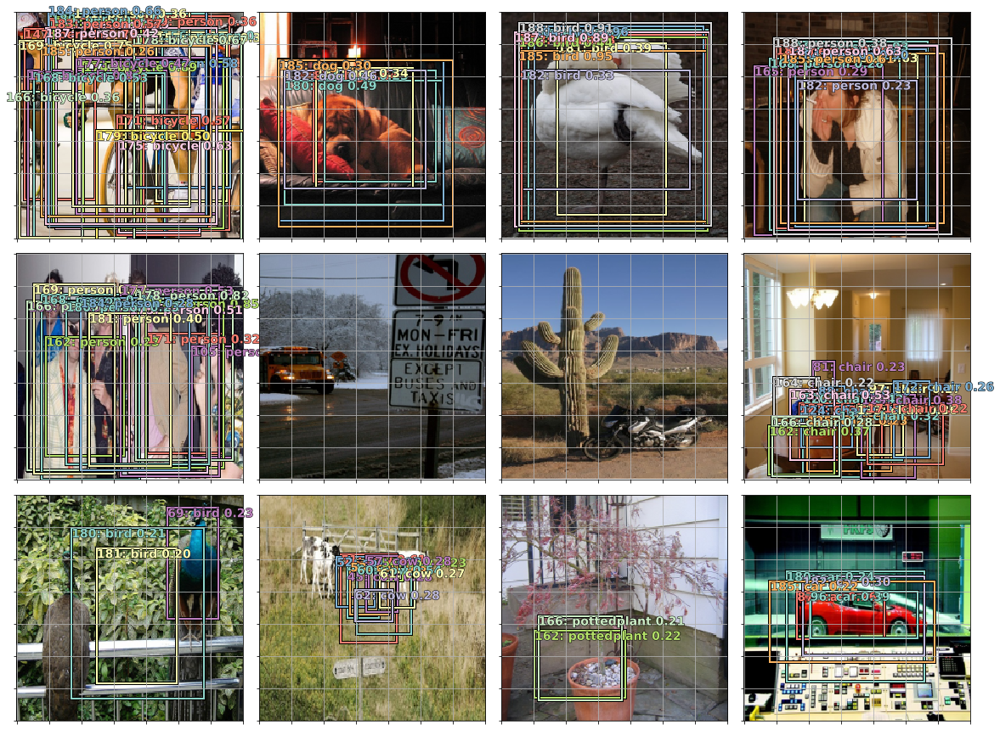

In [348]:
x,y = next(iter(modeldata.val_dl))
x = V(x)
pred_clas, pred_bb = learn.model(x)
x = to_np(x)

fig, axes = plt.subplots(3, 4, figsize=(16, 12))
for idx,ax in enumerate(axes.flat):
    img=modeldata.val_ds.ds.denorm(x)[idx]
    pred_bboxes = act_to_bb(pred_bb[idx], anchors)
    plot_gt(ax, img, pred_bboxes, pred_clas[idx].max(1)[1], prs=pred_clas[idx].max(1)[0].sigmoid(), thresh=0.2)
plt.tight_layout()

**For the large objects, it's working well now, however, the motorbike or bus (small objects) were not detected.**

**Loss function as we use it now prefers to use larger boxes, because they usually do contain the main object and ignore smaller boxes as they usually contain background. We need a better loss function: *Focal loss*.**

## Focal loss

In [349]:
class FocalLoss(BCE_Loss):
    def get_weight(self, x, t):
        alpha, gamma = 0.25, 2.
        p = x.sigmoid()
        pt = p*t + (1-p)*(1-t)
        w = alpha*t + (1-alpha)*(1-t)
        return w * (1-pt).pow(gamma)

In [350]:
loss_f = FocalLoss(len(id2cat))

In [356]:
lr = 1e-2
lrs = np.array([lr/100, lr/10, lr])

In [357]:
learn.fit(lrs=lrs, n_cycle=1, cycle_len=10, use_clr=(20, 10))

  0%|          | 0/32 [00:00<?, ?it/s]

/home/fabiograetz/anaconda3/envs/deeplearning/lib/python3.6/site-packages/torch/nn/functional.py:52: UserWarning: size_average and reduce args will be deprecated, please use reduction='sum' instead.
  warnings.warn(warning.format(ret))


epoch      trn_loss   val_loss                            
    0      23.901028  31.246001 
    1      20.522875  17.03174                            
    2      18.150159  15.195573                           
    3      16.335173  13.900662                           
    4      14.864038  13.076386                           
    5      13.713459  12.804952                           
    6      12.86849   12.269534                           
    7      12.189886  12.03291                            
    8      11.649995  11.762357                           
    9      11.234906  11.654096                           



[11.654096389770508]

In [358]:
learn.save('focal')

In [367]:
learn.load('focal')

In [368]:
learn.freeze_to(-2)

In [369]:
learn.fit(lrs=lrs/2, n_cycle=1, cycle_len=10, use_clr=(20, 10))

  0%|          | 0/32 [00:00<?, ?it/s]

/home/fabiograetz/anaconda3/envs/deeplearning/lib/python3.6/site-packages/torch/nn/functional.py:52: UserWarning: size_average and reduce args will be deprecated, please use reduction='sum' instead.
  warnings.warn(warning.format(ret))


 34%|███▍      | 11/32 [00:06<00:11,  1.80it/s, loss=11.3]
epoch      trn_loss   val_loss                            
    0      11.663341  13.074793 
    1      11.947409  12.874522                           
    2      11.550785  11.903115                           
    3      10.953408  11.391113                           
    4      10.259737  10.815846                           
    5      9.688757   10.77556                            
    6      9.126004   10.651833                           
    7      8.667211   10.362139                           
    8      8.259715   10.270403                           
    9      7.922313   10.178064                           



[10.178064460754394]

In [370]:
def plot_results(thresh):
    x,y = next(iter(modeldata.val_dl))
    batch = learn.model(V(x))
    b_clas,b_bb = batch

    x = to_np(x)
    fig, axes = plt.subplots(3, 4, figsize=(16, 12))
    for idx,ax in enumerate(axes.flat):
        ima=modeldata.val_ds.ds.denorm(x)[idx]
        a_ic = act_to_bb(b_bb[idx], anchors)
        clas_pr, clas_ids = b_clas[idx].max(1)
        clas_pr = clas_pr.sigmoid()
        plot_gt(ax, ima, a_ic, clas_ids, clas_pr, clas_pr.max().data[0]*thresh)
    plt.tight_layout()

/home/fabiograetz/anaconda3/envs/deeplearning/lib/python3.6/site-packages/ipykernel/__main__.py:13: UserWarning: invalid index of a 0-dim tensor. This will be an error in PyTorch 0.5. Use tensor.item() to convert a 0-dim tensor to a Python number
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


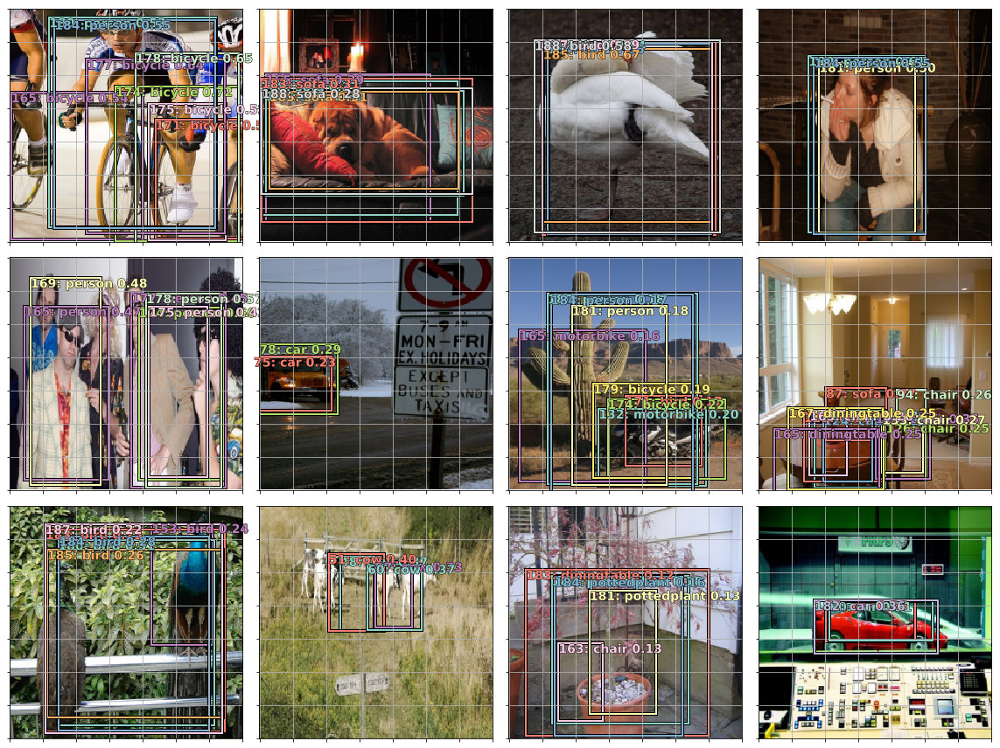

In [371]:
plot_results(0.7)

**Now, also the motorbike and the bus (misclassified) have a box. Only problem, we have to many boxes. Let's keep only one of all boxes that predict the same class and that overlap more than a certain threshold.**

## Non maximum supression

In [372]:
def nms(boxes, scores, overlap=0.5, top_k=100):
    keep = scores.new(scores.size(0)).zero_().long()
    if boxes.numel() == 0: return keep
    x1 = boxes[:, 0]
    y1 = boxes[:, 1]
    x2 = boxes[:, 2]
    y2 = boxes[:, 3]
    area = torch.mul(x2 - x1, y2 - y1)
    v, idx = scores.sort(0)  # sort in ascending order
    idx = idx[-top_k:]  # indices of the top-k largest vals
    xx1 = boxes.new()
    yy1 = boxes.new()
    xx2 = boxes.new()
    yy2 = boxes.new()
    w = boxes.new()
    h = boxes.new()

    count = 0
    while idx.numel() > 0:
        i = idx[-1]  # index of current largest val
        keep[count] = i
        count += 1
        if idx.size(0) == 1: break
        idx = idx[:-1]  # remove kept element from view
        # load bboxes of next highest vals
        torch.index_select(x1, 0, idx, out=xx1)
        torch.index_select(y1, 0, idx, out=yy1)
        torch.index_select(x2, 0, idx, out=xx2)
        torch.index_select(y2, 0, idx, out=yy2)
        # store element-wise max with next highest score
        xx1 = torch.clamp(xx1, min=x1[i])
        yy1 = torch.clamp(yy1, min=y1[i])
        xx2 = torch.clamp(xx2, max=x2[i])
        yy2 = torch.clamp(yy2, max=y2[i])
        w.resize_as_(xx2)
        h.resize_as_(yy2)
        w = xx2 - xx1
        h = yy2 - yy1
        # check sizes of xx1 and xx2.. after each iteration
        w = torch.clamp(w, min=0.0)
        h = torch.clamp(h, min=0.0)
        inter = w*h
        # IoU = i / (area(a) + area(b) - i)
        rem_areas = torch.index_select(area, 0, idx)  # load remaining areas)
        union = (rem_areas - inter) + area[i]
        IoU = inter/union  # store result in iou
        # keep only elements with an IoU <= overlap
        idx = idx[IoU.le(overlap)]
    return keep, count

In [374]:
x,y = next(iter(modeldata.val_dl))
y = V(y)
batch = learn.model(V(x))
b_clas,b_bb = batch
x = to_np(x)

In [377]:
def show_nmf(idx):
    ima=modeldata.val_ds.ds.denorm(x)[idx]
    bbox,clas = get_y(y[0][idx], y[1][idx])
    a_ic = act_to_bb(b_bb[idx], anchors)
    clas_pr, clas_ids = b_clas[idx].max(1)
    clas_pr = clas_pr.sigmoid()

    conf_scores = b_clas[idx].sigmoid().t().data

    out1,out2,cc = [],[],[]
    for cl in range(0, len(conf_scores)-1):
        c_mask = conf_scores[cl] > 0.25
        if c_mask.sum() == 0: continue
        scores = conf_scores[cl][c_mask]
        l_mask = c_mask.unsqueeze(1).expand_as(a_ic)
        boxes = a_ic[l_mask].view(-1, 4)
        ids, count = nms(boxes.data, scores, 0.4, 50)
        ids = ids[:count]
        out1.append(scores[ids])
        out2.append(boxes.data[ids])
        cc.append([cl]*count)
    if not cc:
        print(f"{i}: empty array")
        return
    cc = T(np.concatenate(cc))
    out1 = torch.cat(out1)
    out2 = torch.cat(out2)

    fig, ax = plt.subplots(figsize=(8,8))
    plot_gt(ax, ima, out2, cc, out1, 0.1)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


6: empty array
10: empty array


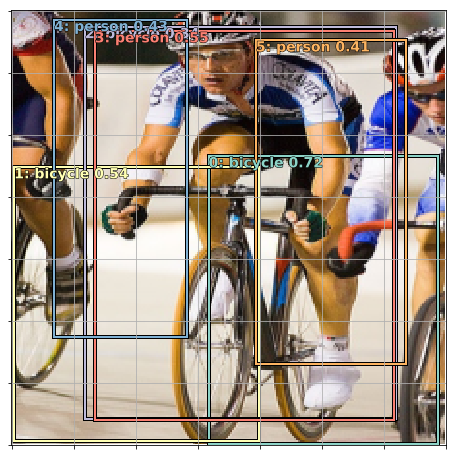

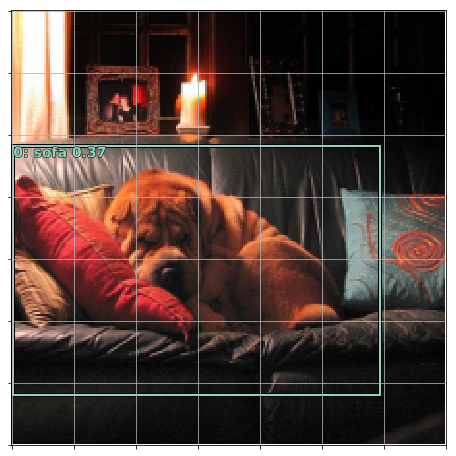

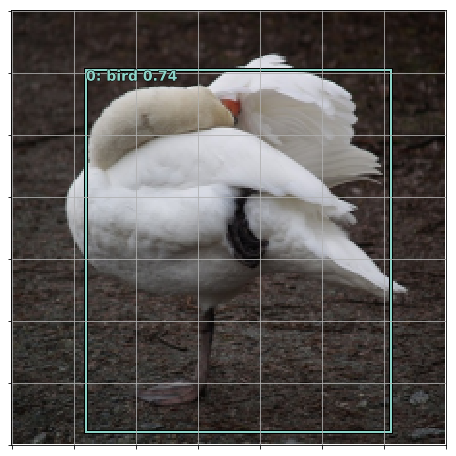

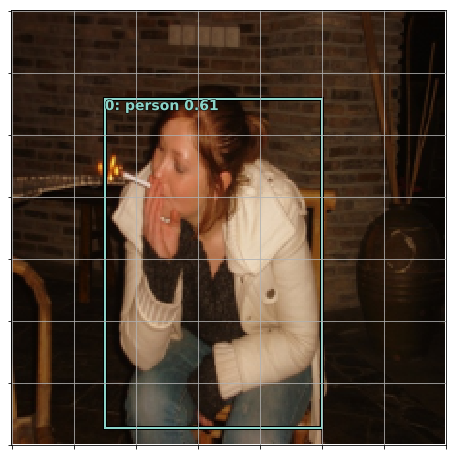

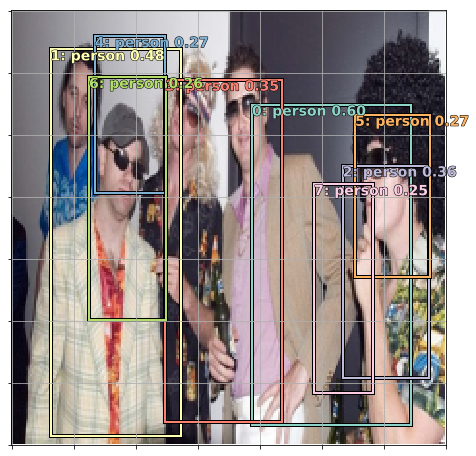

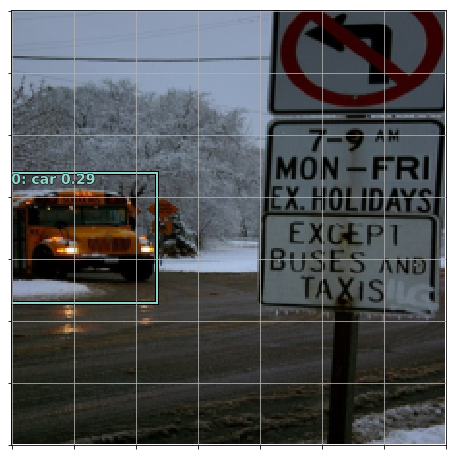

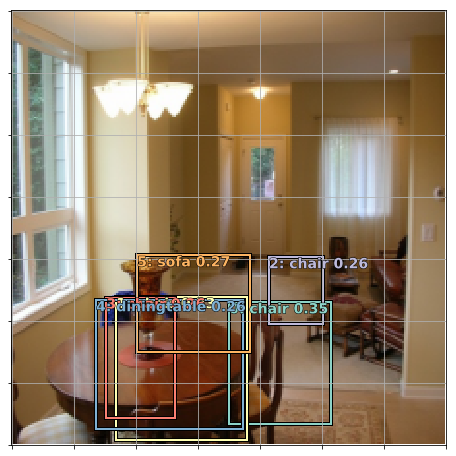

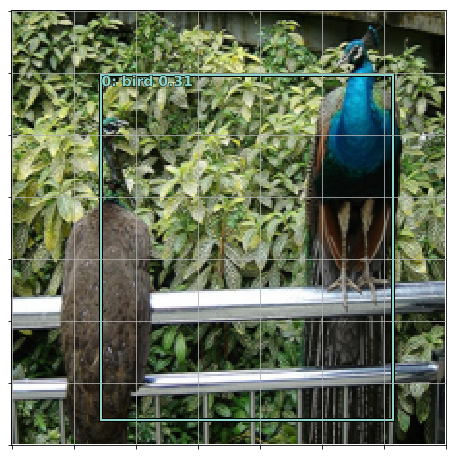

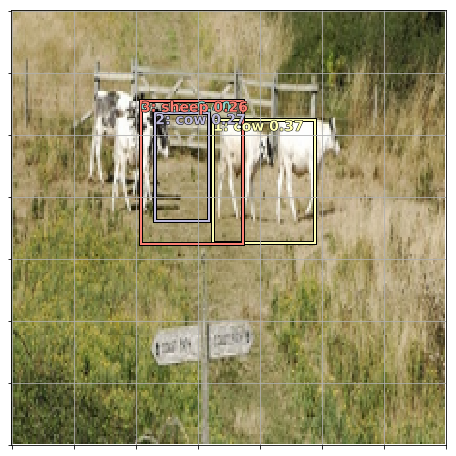

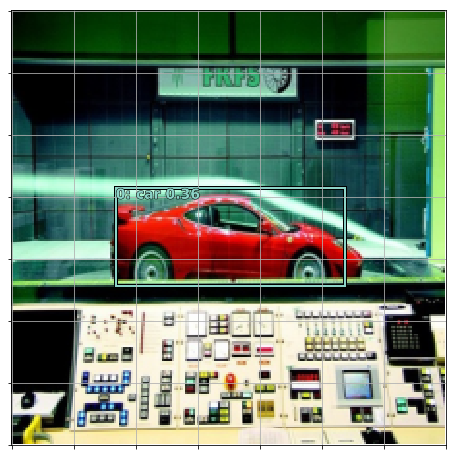

In [378]:
for i in range(12): show_nmf(i)